# From Pixels to Patterns: Visualising Satellite Image Classification

This notebook is based on the tutorial by [Sydney Goldstein](https://urbanspatial.github.io/classifying_satellite_imagery_in_R/) and adapted to Python by [Elisabetta Pietrostefani](https://www.pietrostefani.com/) for this course.

**Goals:**
- Use Landsat 8 data to classify London into **developed, undeveloped, water, and clouds**
- Visualise satellite imagery effectively — from greyscale bands to rich composites
- Find **resources on the newest frontier in satellite analysis: embeddings** — access ready-to-use data derived from models like [Google's SatCLIP / GeoCLIP](https://developers.google.com/earth-engine/datasets/tags/embeddings) and [Google Embeddings Alpha](https://earthengine.google.com/), which encode entire landscapes into compact vectors that can be compared, searched, and clustered at global scale
  
We will cover:
1. Crop and mask raster data to a shapefile extent
2. Explore raster properties and load individual bands
3. Visualise true-colour and false-colour composites
4. Calculate NDVI (Normalised Difference Vegetation Index)
5. Supervised classification
6. *(Bonus)* Satellite embeddings — what they are and why the field is excited about them

---

## Key Python libraries used

| Python | R package | Purpose |
|---|---|---|
| `rasterio` + `numpy` | `raster` | Read/write/process rasters |
| `geopandas` | `sf` | Vector shapefiles |
| `matplotlib` + `earthpy` | `plotRGB` / `mapview` | Visualise composites |
| `sklearn.tree.DecisionTreeClassifier` | `rpart` | Decision tree classification |
| `sklearn.tree.plot_tree` | `rpart.plot` | Visualise the decision tree |
| `sklearn.ensemble.RandomForestClassifier` | `randomForest` | Random forest classification |
| `sklearn.metrics.ConfusionMatrixDisplay` | `caret` (confusionMatrix) | Model evaluation |
| `matplotlib` + `seaborn` | `ggplot2` / `patchwork` | Plotting & layout |
| `pandas.melt` | `tidyr::gather` | Reshape data from wide to long |

The **Lecture slides** can be found [here](https://github.com/GDSL-UL/wma/blob/main/lectures/w07_pixels.pdf).

This **lab**'s notebook can be downloaded from [here](https://github.com/GDSL-UL/wma/blob/main/labs/w07_pixelsToPatterns.ipynb).

## 0. Install & Import Libraries

Run the cell below once to install any missing packages.

In [1]:
# Uncomment and run this cell if you need to install the libraries
# !pip install rasterio geopandas earthpy matplotlib numpy pandas seaborn scikit-learn requests

In [10]:
import os
import glob
import zipfile
import requests

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

import rasterio
from rasterio.mask import mask as rio_mask
from rasterio.plot import show, show_hist
from rasterio.enums import Resampling
import rasterio.warp as warp

import geopandas as gpd
from shapely.geometry import mapping, box

import earthpy.plot as ep

from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, confusion_matrix, ConfusionMatrixDisplay
)

print("All libraries imported successfully!")

All libraries imported successfully!


---
## 1. Crop and Mask to London Extent

Landsat 8 data covers large swaths of the Earth. Our first step is to **crop** (cut to a bounding box) and **mask** (remove pixels outside a polygon) the imagery to just the London boundary.

We use:
- `geopandas` to load the London wards shapefile
- `rasterio.mask` to crop and mask each band

### Download the London shapefile

> **Task 1:** Before running the code, visit https://earthexplorer.usgs.gov/ and explore what Landsat 8 data includes. What bands are available and what does each measure?

Shapefile already exists — skipping download.
Loaded 649 wards | CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


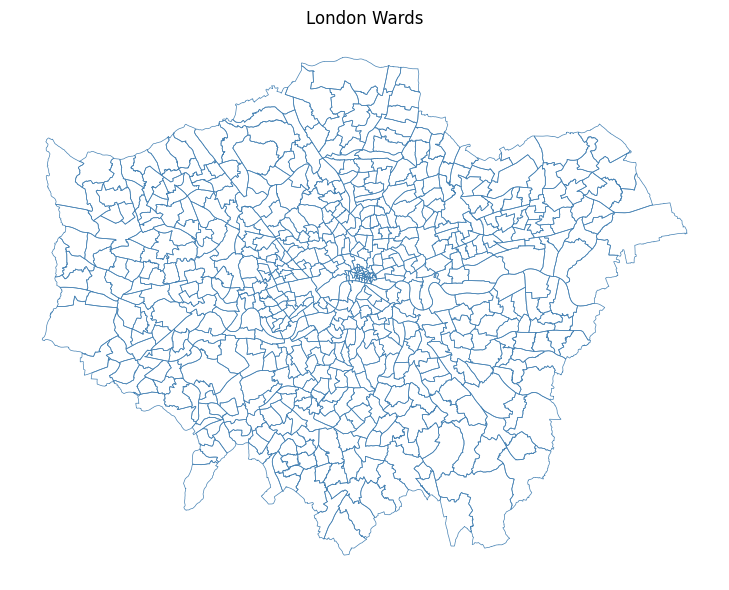

In [12]:
# ── Download London Wards shapefile ──────────────────────────────────────────

SHAPEFILE_PATH = "../data/pixels/statistical-gis-boundaries-london/London_ward.shp"
ZIP_PATH = "../data/pixels/statistical-gis-boundaries-london.zip"
URL = (
    "https://data.london.gov.uk/download/statistical-gis-boundary-files-london/"
    "9ba8c833-6370-4b11-abdc-314aa020d5e0/statistical-gis-boundaries-london.zip"
)

os.makedirs("data", exist_ok=True)

if not os.path.exists(SHAPEFILE_PATH):
    print("Downloading London shapefile...")
    response = requests.get(URL, stream=True)
    with open(ZIP_PATH, "wb") as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
    with zipfile.ZipFile(ZIP_PATH, "r") as zf:
        zf.extractall("data")
    print("Done!")
else:
    print("Shapefile already exists — skipping download.")

# Load wards
wards = gpd.read_file(SHAPEFILE_PATH)
print(f"Loaded {len(wards)} wards | CRS: {wards.crs}")

# Quick plot
fig, ax = plt.subplots(figsize=(8, 6))
wards.plot(ax=ax, edgecolor="steelblue", facecolor="none", linewidth=0.5)
ax.set_title("London Wards")
ax.set_axis_off()
plt.tight_layout()
plt.show()

In [17]:
# ── Crop and mask each Landsat band ──────────────────────────────────────────

# List all raw .TIF files in the data/ folder
tifs = sorted(glob.glob("../data/pixels/*.TIF"))
print(f"Found {len(tifs)} TIF files: {[os.path.basename(t) for t in tifs]}")

os.makedirs("../data/pixels/landsat", exist_ok=True)


def crop_and_mask(tif_path: str, shapes, out_dir: str = "../data/pixels/landsat") -> str:
    """
    Crops and masks a single raster to the union of `shapes`.

    Parameters
    ----------
    tif_path : str   Path to the input .TIF file.
    shapes   : list  List of GeoJSON-like geometries (from geopandas).
    out_dir  : str   Folder where the masked raster is saved.

    Returns
    -------
    str  Path to the output raster.
    """
    basename = os.path.basename(tif_path).replace(".TIF", ".tif")
    out_path = os.path.join(out_dir, f"London_{basename}") # Defining them just for London perimetre

    if os.path.exists(out_path):
        print(f"  Already exists — skipping: {basename}")
        return out_path

    with rasterio.open(tif_path) as src:
        # Re-project the shapefile to match the raster CRS
        shapes_reprojected = shapes.to_crs(src.crs)
        geoms = [mapping(geom) for geom in shapes_reprojected.geometry]

        # Crop (bounding box) + mask (exact polygon)
        out_image, out_transform = rio_mask(src, geoms, crop=True)
        out_meta = src.meta.copy()

    out_meta.update({
        "driver": "GTiff",
        "height": out_image.shape[1],
        "width": out_image.shape[2],
        "transform": out_transform,
    })

    with rasterio.open(out_path, "w", **out_meta) as dst:
        dst.write(out_image)

    print(f"  Saved: {out_path}")
    return out_path


# Apply to all bands
cropped_paths = [crop_and_mask(t, wards) for t in tifs]
print("\nAll bands cropped and masked!")

Found 19 TIF files: ['LC08_L2SP_201024_20210418_20210424_02_T1_QA_PIXEL.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_QA_RADSAT.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B1.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B2.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B3.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B4.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B5.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B6.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_B7.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_SR_QA_AEROSOL.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_ATRAN.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_B10.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_CDIST.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_DRAD.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_EMIS.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_EMSD.TIF', 'LC08_L2SP_201024_20210418_20210424_02_T1_ST_QA.TIF', 'LC08_L2SP_201024_20210418_202104

---
## 2. Raster Properties & Loading Bands

> **Answer to Task 1:** Landsat 8 carries two sensors — the **Operational Land Imager (OLI)** and the **Thermal Infrared Sensor (TIRS)** — providing 11 spectral bands in total:

| Band | Name | Wavelength | Resolution | What it's good for |
|------|------|-----------|------------|--------------------|
| 1 | Ultra Blue (Coastal/Aerosol) | 0.43–0.45 µm | **30 m** | Coastal water, aerosol studies — new in Landsat 8 |
| 2 | Blue | 0.45–0.51 µm | **30 m** | Water depth, soil/vegetation distinction |
| 3 | Green | 0.53–0.59 µm | **30 m** | Peak vegetation reflectance |
| 4 | Red | 0.64–0.67 µm | **30 m** | Chlorophyll absorption; vegetation vs bare soil |
| 5 | Near Infrared (NIR) | 0.85–0.88 µm | **30 m** | Biomass, vegetation health, water body edges |
| 6 | SWIR-1 | 1.57–1.65 µm | **30 m** | Soil moisture, snow/cloud differentiation |
| 7 | SWIR-2 | 2.11–2.29 µm | **30 m** | Geology, mineralogy, fire burn scars |
| 8 | Panchromatic | 0.50–0.68 µm | **15 m** | High-resolution greyscale — pan-sharpening |
| 9 | Cirrus | 1.36–1.38 µm | **30 m** | Detecting high-altitude cirrus cloud contamination |
| 10 | Thermal Infrared (TIRS-1) | 10.6–11.19 µm | **100 m** | Surface temperature |
| 11 | Thermal Infrared (TIRS-2) | 11.50–12.51 µm | **100 m** | Surface temperature (more accurate dual-band retrieval) |

> **What does 30 m resolution actually mean?** Each pixel covers a **30 × 30 metre** square on the ground — roughly the footprint of a large house. At 15 m (Band 8), a pixel is about the size of a car parking space. This is coarse compared to commercial satellites (which can reach 0.3 m), but Landsat's free global archive stretching back to 1972 makes it uniquely valuable for long-term change detection.
>
> In this exercise we focus on **Bands 1–7** (all at 30 m).

In Python with `rasterio`, each band is loaded as a 2D `numpy` array — giving us full numerical control for calculations.

> **Task 2:** After loading the bands below, plot them one at a time. What differences do you notice in brightness and range? Why does vegetation appear brighter in Band 5 (NIR)?

In [20]:
# ── Load individual bands by explicit filename ────────────────────────────────

BASE = "../data/pixels/landsat/London_LC08_L2SP_201024_20210418_20210424_02_T1_SR"

BAND_FILES = {
    "band1": f"{BASE}_B1.tif",
    "band2": f"{BASE}_B2.tif",
    "band3": f"{BASE}_B3.tif",
    "band4": f"{BASE}_B4.tif",
    "band5": f"{BASE}_B5.tif",
    "band6": f"{BASE}_B6.tif",
    "band7": f"{BASE}_B7.tif",
}

bands = {}
band_names = list(BAND_FILES.keys())

for name, path in BAND_FILES.items():
    with rasterio.open(path) as src:
        data = src.read(1).astype("float32")  # read as float for NDVI etc.
        nodata = src.nodata
        if nodata is not None:
            data[data == nodata] = np.nan     # mask no-data pixels
        bands[name] = data

        if name in ("band1", "band7"):        # print metadata for first and last
            print(f"\n{name.upper()} — {path}")
            print(f"  Shape      : {src.shape}")
            print(f"  CRS        : {src.crs}")
            print(f"  Resolution : {src.res} m")
            print(f"  Bounds     : {src.bounds}")
            print(f"  Min / Max  : {np.nanmin(data):.0f} / {np.nanmax(data):.0f}")

# Also keep a list of the paths in band order for rasterio operations later
landsat_tifs = list(BAND_FILES.values())

print("\nAll 7 bands loaded:", band_names)


BAND1 — ../data/pixels/landsat/London_LC08_L2SP_201024_20210418_20210424_02_T1_SR_B1.tif
  Shape      : (1509, 1965)
  CRS        : EPSG:32631
  Resolution : (30.0, 30.0) m
  Bounds     : BoundingBox(left=256185.0, bottom=5686095.0, right=315135.0, top=5731365.0)
  Min / Max  : 38 / 60798

BAND7 — ../data/pixels/landsat/London_LC08_L2SP_201024_20210418_20210424_02_T1_SR_B7.tif
  Shape      : (1509, 1965)
  CRS        : EPSG:32631
  Resolution : (30.0, 30.0) m
  Bounds     : BoundingBox(left=256185.0, bottom=5686095.0, right=315135.0, top=5731365.0)
  Min / Max  : 6742 / 65454

All 7 bands loaded: ['band1', 'band2', 'band3', 'band4', 'band5', 'band6', 'band7']


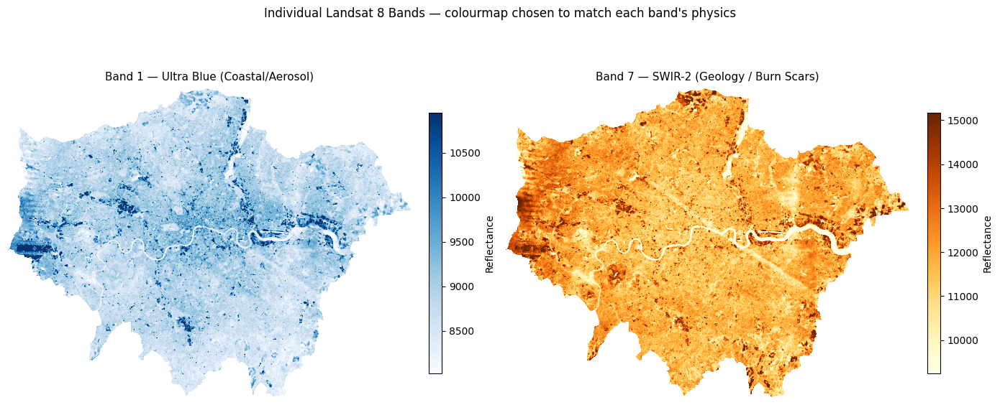

In [21]:
# ── Plot Band 1 and Band 7 with perceptually meaningful colourmaps ───────────
#
#  Each band is ONE number per pixel — to add colour we use a colourmap instead.
#  We pick colourmaps that match what each band physically measures:
#  Band 1 (Ultra Blue / coastal aerosol) → 'Blues'  — darker = more scattering
#  Band 7 (SWIR-2 / geology & burn scars) → 'YlOrBr' — warmer = more thermal emission
#
# A linear percentile stretch (vmin/vmax at 2nd–98th percentile) removes
# outlier bright pixels (clouds, water glint) that would otherwise wash out
# the colour range across the rest of the scene.

BAND_CMAPS = {
    "band1": ("Blues",    "Band 1 — Ultra Blue (Coastal/Aerosol)"),
    "band7": ("YlOrBr",   "Band 7 — SWIR-2 (Geology / Burn Scars)"),
}

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for ax, (bname, (cmap, title)) in zip(axes, BAND_CMAPS.items()):
    data = bands[bname]
    # 2–98th percentile stretch so outliers don't dominate the colour scale
    vmin, vmax = np.nanpercentile(data, [2, 98])
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=11, pad=8)
    ax.set_axis_off()
    fig.colorbar(im, ax=ax, fraction=0.03, pad=0.04, label="Reflectance")

plt.suptitle(
    "Individual Landsat 8 Bands — colourmap chosen to match each band's physics",
    fontsize=12, y=1.02
)
plt.tight_layout()
plt.show()

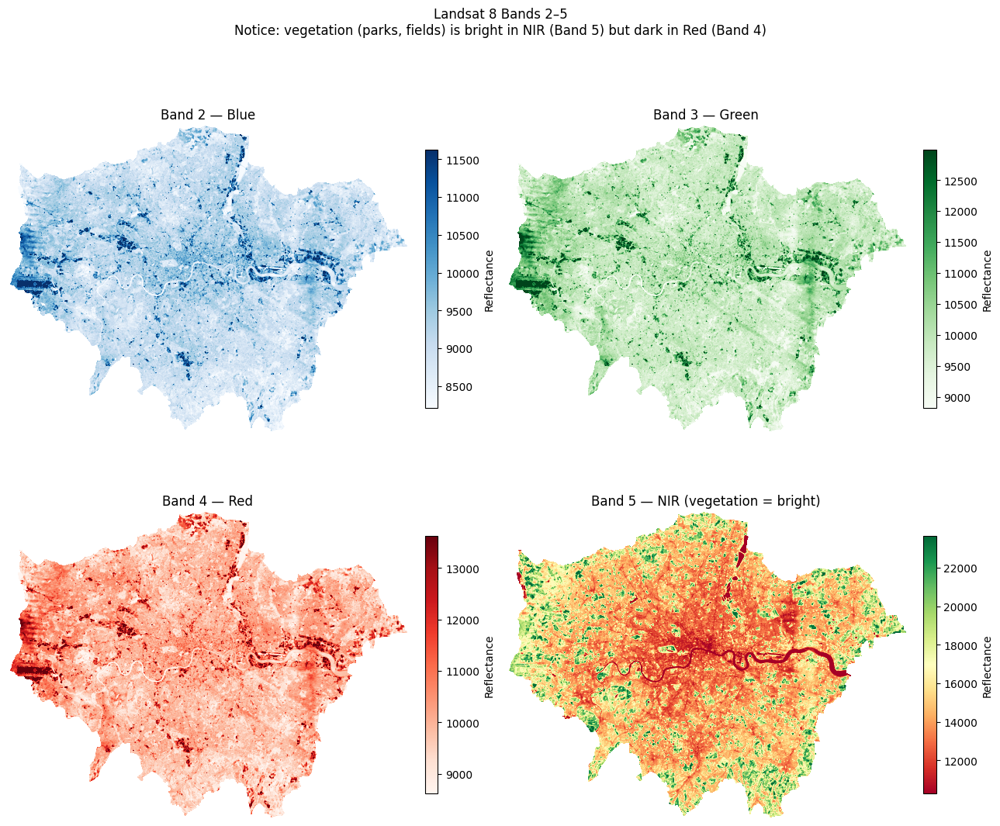

In [22]:
# ── Plot Bands 2–5 in a 2×2 grid with matched colourmaps ─────────────────────
# R equivalent: par(mfrow=c(2,2)); plot(band, col=gray(...))
#
# Colourmap choices:
#   Band 2 Blue  → 'Blues'    — water appears dark, urban bright
#   Band 3 Green → 'Greens'   — vegetation peaks here
#   Band 4 Red   → 'Reds'     — chlorophyll absorption; veg appears dark
#   Band 5 NIR   → 'RdYlGn'   — vegetation bright green, water near-black

BAND_GRID = {
    "band2": ("Blues",   "Band 2 — Blue"),
    "band3": ("Greens",  "Band 3 — Green"),
    "band4": ("Reds",    "Band 4 — Red"),
    "band5": ("RdYlGn",  "Band 5 — NIR (vegetation = bright)"),
}

fig, axes = plt.subplots(2, 2, figsize=(13, 11))

for ax, (bname, (cmap, label)) in zip(axes.flatten(), BAND_GRID.items()):
    data = bands[bname]
    vmin, vmax = np.nanpercentile(data, [2, 98])   # percentile stretch
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_title(label, fontsize=12)
    ax.set_axis_off()
    fig.colorbar(im, ax=ax, fraction=0.03, pad=0.04, label="Reflectance")

plt.suptitle(
    "Landsat 8 Bands 2–5\n"
    "Notice: vegetation (parks, fields) is bright in NIR (Band 5) but dark in Red (Band 4)",
    fontsize=12, y=1.02
)
plt.tight_layout()
plt.show()

---
## 3. RGB Composites — True Colour & False Colour

Individual greyscale bands don't convey much on their own. We stack three bands into an **RGB composite**:

| Composite | Red channel | Green channel | Blue channel | What it shows |
|---|---|---|---|---|
| **True colour** | Band 4 (Red) | Band 3 (Green) | Band 2 (Blue) | How the scene looks to the human eye |
| **False colour (NIR)** | Band 5 (NIR) | Band 4 (Red) | Band 3 (Green) | Vegetation appears **red/pink**; built-up appears **cyan/blue** |

We use `earthpy.plot.plot_rgb()` which handles normalisation automatically.

In [23]:
# ── Stack all 7 bands into a single 3D array (bands × rows × cols) ────────────
# This mirrors R's stack() / RasterStack

landsat_stack = np.stack(
    [bands[f"band{i}"] for i in range(1, 8)],
    axis=0
)  # shape: (7, rows, cols)

n_bands, n_rows, n_cols = landsat_stack.shape
print(f"Stack shape : {landsat_stack.shape}")
print(f"Number of bands : {n_bands}")
print(f"Spatial dimensions : {n_rows} rows × {n_cols} cols")

Stack shape : (7, 1509, 1965)
Number of bands : 7
Spatial dimensions : 1509 rows × 1965 cols


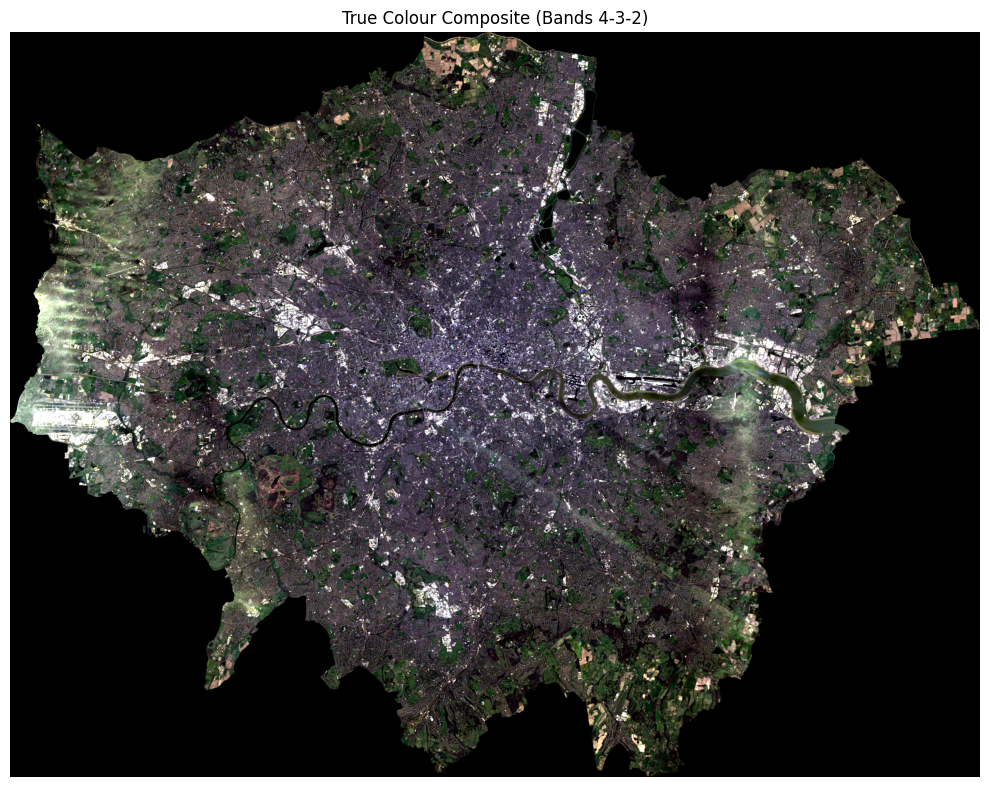

In [24]:
# ── True Colour Composite ────────────────────────────────────────────────────
#
# True colour = how the scene looks to the human eye: Red, Green, Blue channels.
# In Landsat 8:  Red = Band 4,  Green = Band 3,  Blue = Band 2
# This is written as '4-3-2' in remote sensing shorthand (R-G-B order).
#
# earthpy uses 0-based indexing into the stack, so:
#   Band 4 → stack index 3  (R)
#   Band 3 → stack index 2  (G)
#   Band 2 → stack index 1  (B)
#
# '4-3-2' and rgb=(3,2,1) describe exactly the same composite.

def percentile_stretch(stack, lo=2, hi=98):
    """
    Clip each band in `stack` (shape: bands × rows × cols) to the
    [lo, hi] percentile range and rescale to 0.0–1.0.
    Returns a float32 array of the same shape.
    """
    out = np.zeros_like(stack, dtype="float32")
    for i in range(stack.shape[0]):
        band = stack[i].astype("float32")
        vmin, vmax = np.nanpercentile(band, [lo, hi])
        out[i] = np.clip((band - vmin) / (vmax - vmin + 1e-6), 0, 1)
    return out

landsat_display = percentile_stretch(landsat_stack)   # reuse for all composites
landsat_display = np.nan_to_num(landsat_display, nan=0.0)  # nan → 0 for display only; doesn't affect bands dict

fig, ax = plt.subplots(figsize=(10, 8))
ep.plot_rgb(
    landsat_display,
    rgb=(3, 2, 1),    # 0-indexed: band4=index 3, band3=index 2, band2=index 1
    ax=ax,
    title="True Colour Composite (Bands 4-3-2)"
)
ax.set_axis_off()
plt.tight_layout()
plt.show()

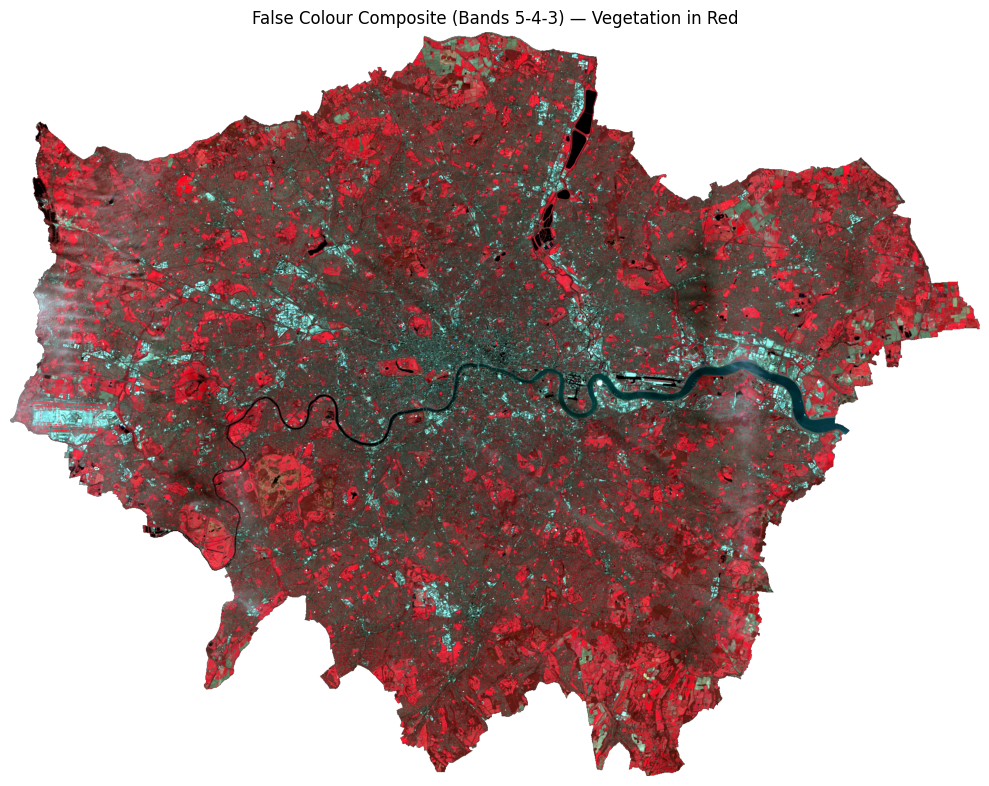

In [44]:
# ── False Colour / NIR Composite (RGB = Bands 5, 4, 3) ───────────────────────
# Vegetation reflects strongly in NIR → appears red/magenta
# Urban surfaces reflect less NIR → appear cyan/blue

fig, ax = plt.subplots(figsize=(10, 8))
ep.plot_rgb(
    landsat_stack,
    rgb=(4, 3, 2),         # 0-indexed: band5=4, band4=3, band3=2
    stretch=True,
    str_clip=0.5,
    ax=ax,
    title="False Colour Composite (Bands 5-4-3) — Vegetation in Red"
)
ax.set_axis_off()
plt.tight_layout()
plt.show()

/opt/miniconda3/envs/envs363_563/lib/python3.11/site-packages/earthpy/spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


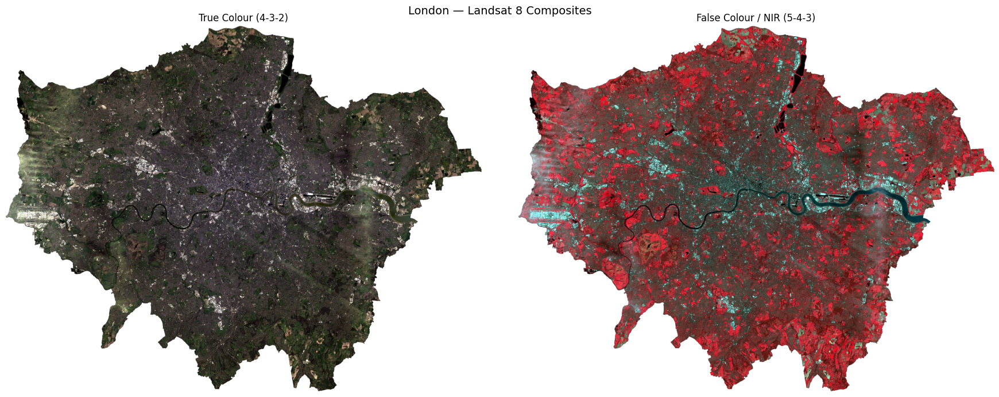

In [25]:
# ── Side-by-side comparison ───────────────────────────────────────────────────

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

ep.plot_rgb(landsat_stack, rgb=(3, 2, 1), stretch=True, str_clip=0.5,
            ax=axes[0], title="True Colour (4-3-2)")
ep.plot_rgb(landsat_stack, rgb=(4, 3, 2), stretch=True, str_clip=0.5,
            ax=axes[1], title="False Colour / NIR (5-4-3)")

for ax in axes:
    ax.set_axis_off()

plt.suptitle("London — Landsat 8 Composites", fontsize=14)
plt.tight_layout()
plt.show()

---
## 4. NDVI — Normalised Difference Vegetation Index

NDVI measures how much **live green vegetation** is present. It exploits the fact that healthy vegetation **absorbs Red light** and **reflects NIR light**:

$$
\text{NDVI} = \frac{\text{NIR} - \text{Red}}{\text{NIR} + \text{Red}} = \frac{\text{Band 5} - \text{Band 4}}{\text{Band 5} + \text{Band 4}}
$$

| NDVI value | Interpretation |
|---|---|
| < 0 | Water, clouds, snow |
| 0 – 0.2 | Bare soil, urban, rock |
| 0.2 – 0.5 | Sparse vegetation, shrubs |
| > 0.5 | Dense, healthy vegetation |

In Python, this is a simple **vectorised numpy operation** — no loops needed.

In [26]:
# ── Calculate NDVI ────────────────────────────────────────────────────────────

nir = bands["band5"]   # Near Infrared
red = bands["band4"]   # Red

# Suppress divide-by-zero warnings where NIR + Red == 0
with np.errstate(divide="ignore", invalid="ignore"):
    ndvi = np.where(
        (nir + red) == 0,
        np.nan,
        (nir - red) / (nir + red)
    ).astype("float32")

print(f"NDVI range : {np.nanmin(ndvi):.3f} to {np.nanmax(ndvi):.3f}")
print(f"Mean NDVI  : {np.nanmean(ndvi):.3f}")

NDVI range : -0.235 to 0.609
Mean NDVI  : 0.197


Let's plot this in a "simple" way:

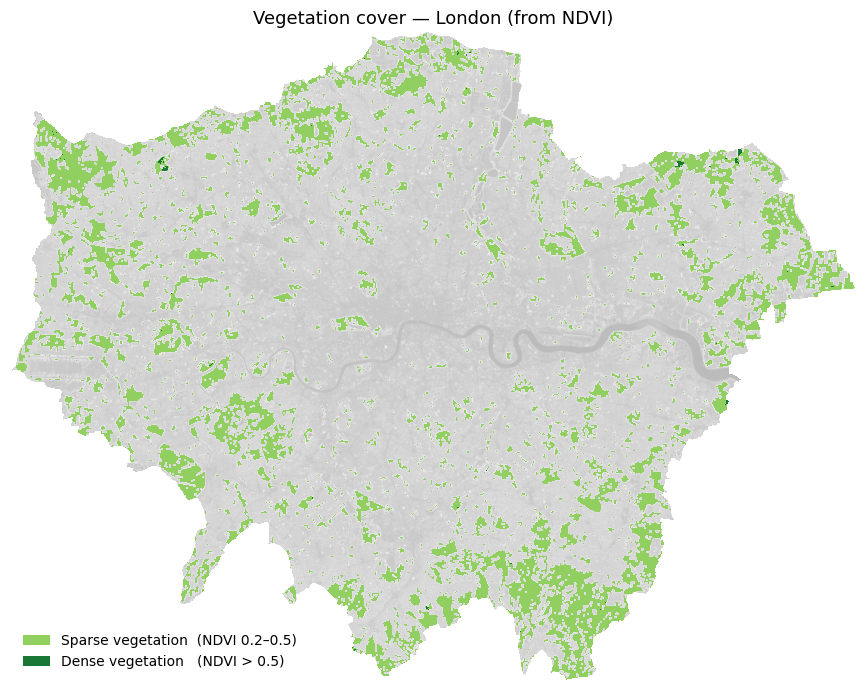

In [27]:
# ── Simple NDVI vegetation map ────────────────────────────────────────────────
# Classify each pixel into just two vegetation categories:
#   Sparse vegetation : 0.2 ≤ NDVI < 0.5  (parks, gardens, scrub)
#   Dense vegetation  : NDVI ≥ 0.5         (woodland, large parks)

veg_map = np.full_like(ndvi, np.nan)
veg_map[(ndvi >= 0.2) & (ndvi < 0.5)] = 1   # sparse
veg_map[ndvi >= 0.5]                  = 2   # dense

cmap_veg  = mcolors.ListedColormap(["#91cf60", "#1a7837"])
norm_veg  = mcolors.BoundaryNorm([0.5, 1.5, 2.5], cmap_veg.N)

fig, ax = plt.subplots(figsize=(9, 7))
ax.imshow(ndvi, cmap="Greys_r", vmin=-0.2, vmax=0.8, alpha=0.3)   # faint grey base
ax.imshow(veg_map, cmap=cmap_veg, norm=norm_veg)                   # vegetation on top
ax.set_title("Vegetation cover — London (from NDVI)", fontsize=13)
ax.set_axis_off()

# Manual legend
from matplotlib.patches import Patch
ax.legend(
    handles=[
        Patch(facecolor="#91cf60", label="Sparse vegetation  (NDVI 0.2–0.5)"),
        Patch(facecolor="#1a7837", label="Dense vegetation   (NDVI > 0.5)"),
    ],
    loc="lower left", frameon=False, fontsize=10
)
plt.tight_layout()
plt.show()


Below is a **full visualisation** (note: the code is fairly complex).

---
## 5. Supervised Classification

We now classify each pixel into one of four land cover types:

| Class label | Description |
|---|---|
| `0` | Water |
| `1` | Developed / Urban |
| `2` | Undeveloped / Vegetation |
| `3` | Cloud |

**Approach — Random Forest Classifier (scikit-learn):**
1. Create training labels by **thresholding NDVI and reflectance values** (a simple rule-based proxy for hand-labelling)
2. Extract the 7-band feature vector for each labelled pixel
3. Train a `RandomForestClassifier`
4. Predict across the full image and visualise the result

> In a real project, training labels would come from **digitised ground truth polygons** in a GIS. The rule-based approach below is used here purely for demonstration.

### How would you create training points in Python?

This is an approach for **interactive digitising** in Python:

| Tool | How |
|---|---|
| [**leafmap**](https://leafmap.org/) | Draw points on an interactive Leaflet map in Jupyter, export as GeoJSON |
| [**geemap**](https://geemap.org/) | Same but connected to Google Earth Engine — useful for larger areas |
| **QGIS → GeoJSON** | Digitise in QGIS, export as `.geojson` or `.shp`, load with `geopandas` |

A `leafmap` workflow would look like this — **you do not need to run this**:

```python
# pip install leafmap
import leafmap

m = leafmap.Map()
m.add_basemap('SATELLITE')
m  # displays interactive map — draw your points using the toolbar

# After drawing:
gdf = m.get_drawn_features()          # returns a GeoDataFrame
gdf['class'] = 'clouds'               # label this batch
# ... repeat for each class, then:
training_points = pd.concat([clouds, developed, undeveloped, water])
training_points.to_file('data/london_trainingPoints_example.shp')
```

For this exercise, **training points have already been prepared** and saved as a shapefile. We load them directly below.

In [30]:
# ── Step 1: Load pre-prepared training points ────────────────────────────────────────

# The shapefile contains hand-digitised points for four land cover classes:
#   id=1  clouds       id=2  developed
#   id=3  undeveloped  id=4  water

training_points = gpd.read_file(
    "../data/pixels/london_trainingPoints/london_trainingPoints.shp"
)
print(f"Loaded {len(training_points)} training points")
print(training_points[["class", "id"]].value_counts().sort_index())

# Reproject to raster CRS for extraction
with rasterio.open(landsat_tifs[0]) as src:
    raster_crs = src.crs
tp_proj = training_points.to_crs(raster_crs)

# Extract band values at each training point
# Equivalent of R: df <- raster::extract(landsat, training_points)
coords = [(geom.x, geom.y) for geom in tp_proj.geometry]

extracted = {}
for name, path in BAND_FILES.items():
    with rasterio.open(path) as src:
        extracted[name] = [v[0] for v in src.sample(coords)]

df_extract = pd.DataFrame(extracted)
df_extract["class"] = training_points["class"].values
df_extract["id"]    = training_points["id"].values
df_extract = df_extract.dropna()

print(f"\nExtracted band values for {len(df_extract)} points")
print(df_extract.head())

Loaded 57 training points
class        id 
clouds       1.0     9
developed    2.0    12
undeveloped  3.0    14
water        4.0    22
Name: count, dtype: int64

Extracted band values for 57 points
   band1  band2  band3  band4  band5  band6  band7   class   id
0  11636  12300  14071  15659  17048  17925  16451  clouds  1.0
1  13482  14387  15285  15875  16448  16042  14579  clouds  1.0
2  14452  15474  16947  18472  20646  21577  16697  clouds  1.0
3  12589  13673  15304  16322  16906  16274  14316  clouds  1.0
4  12592  13407  15333  16942  19117  19893  17447  clouds  1.0


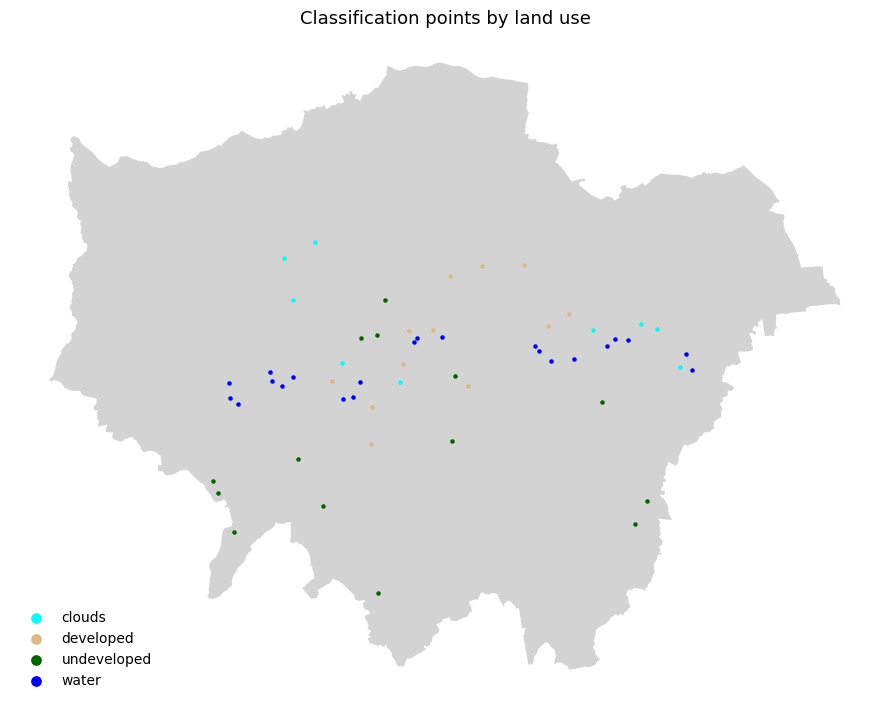

In [33]:
# ── Step 2: Plot training points coloured by land use class ──────────────────────────

CLASS_COLOURS = {
    "clouds":      "cyan",
    "developed":   "burlywood",
    "undeveloped": "darkgreen",
    "water":       "blue",
}

# Load city boundary and reproject everything to the same CRS
city_boundary = gpd.read_file(
    "../data/pixels/statistical-gis-boundaries-london/London_ward.shp"
).dissolve()

# Use the raster CRS as the common reference
with rasterio.open(landsat_tifs[0]) as src:
    plot_crs = src.crs

city_boundary        = city_boundary.to_crs(plot_crs)
training_points_plot = training_points.to_crs(plot_crs)

fig, ax = plt.subplots(figsize=(9, 8))
city_boundary.plot(ax=ax, color="lightgray", edgecolor="none")

for cls, colour in CLASS_COLOURS.items():
    subset = training_points_plot[training_points_plot["class"] == cls]
    subset.plot(ax=ax, color=colour, markersize=5, label=cls)

ax.set_title("Classification points by land use", fontsize=13)
ax.legend(markerscale=3, frameon=False, fontsize=10, loc="lower left")
ax.set_axis_off()
plt.tight_layout()
plt.show()

In [34]:
# ── Step 2: Train Random Forest on the loaded training points ────────────────
# Build feature matrix X and label vector y from the extracted band values

BAND_COLS = [f"band{i}" for i in range(1, 8)]

X = df_extract[BAND_COLS].values
y = df_extract["class"].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
print(f"Training samples : {len(X_train):,}")
print(f"Test samples     : {len(X_test):,}")

# RandomForestClassifier is the Python equivalent of R's randomForest()
rf = RandomForestClassifier(
    n_estimators=100,
    max_features="sqrt",
    n_jobs=-1,
    random_state=42
)
rf.fit(X_train, y_train)
print("\nTraining complete!")

y_pred = rf.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Training samples : 45
Test samples     : 12

Training complete!

Classification Report:
              precision    recall  f1-score   support

      clouds       1.00      1.00      1.00         2
   developed       1.00      1.00      1.00         2
 undeveloped       1.00      1.00      1.00         3
       water       1.00      1.00      1.00         5

    accuracy                           1.00        12
   macro avg       1.00      1.00      1.00        12
weighted avg       1.00      1.00      1.00        12



In [35]:
# ── Step 3: Predict across the full image ─────────────────────────────────────

X_full = np.column_stack(
    [bands[f"band{i}"].ravel() for i in range(1, 8)]
)
valid_mask = ~np.isnan(X_full).any(axis=1)
X_valid    = X_full[valid_mask]

predicted_flat = np.full(X_full.shape[0], fill_value="", dtype=object)
predicted_flat[valid_mask] = rf.predict(X_valid)

# Map string class names to integers for visualisation
class_to_int = {"clouds": 1, "developed": 2, "undeveloped": 3, "water": 4}
int_to_class = {v: k for k, v in class_to_int.items()}
class_names  = list(class_to_int.keys())

predicted_int = np.array(
    [class_to_int.get(c, 0) for c in predicted_flat], dtype="float32"
)
predicted_int[~valid_mask] = np.nan
predicted_map = predicted_int.reshape(bands["band1"].shape)

print("Prediction complete!")
for cls, cid in class_to_int.items():
    pct = np.nansum(predicted_map == cid) / np.sum(~np.isnan(predicted_map)) * 100
    print(f"  {cls:12s} : {pct:.1f}% of pixels")

Prediction complete!
  clouds       : 4.5% of pixels
  developed    : 35.6% of pixels
  undeveloped  : 57.7% of pixels
  water        : 2.2% of pixels


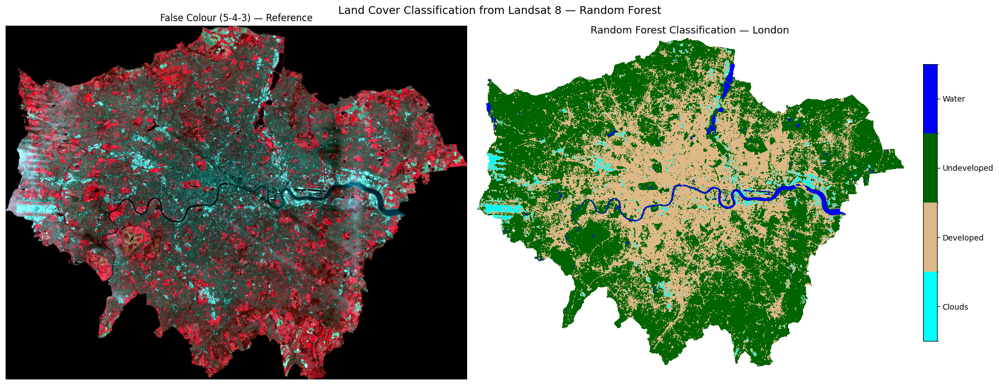

In [60]:
# ── Step 5: Visualise classification result ───────────────────────────────────

cmap = mcolors.ListedColormap(["cyan", "burlywood", "darkgreen", "blue"])
bounds = [0.5, 1.5, 2.5, 3.5, 4.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

ep.plot_rgb(landsat_display, rgb=(4, 3, 2),
            ax=axes[0], title="False Colour (5-4-3) — Reference")
axes[0].set_axis_off()

im = axes[1].imshow(predicted_map, cmap=cmap, norm=norm)
axes[1].set_title("Random Forest Classification — London", fontsize=13)
axes[1].set_axis_off()
cbar = fig.colorbar(im, ax=axes[1], fraction=0.03, pad=0.04, ticks=[1, 2, 3, 4])
cbar.ax.set_yticklabels(["Clouds", "Developed", "Undeveloped", "Water"])

plt.suptitle("Land Cover Classification from Landsat 8 — Random Forest", fontsize=14)
plt.tight_layout()
plt.show()

> **Task 3:** Does this classification look correct for London? Consider what you know about the city — are the land cover classes (clouds, developed, undeveloped, and water) distributed where you would expect them to be? Are there any areas that look misclassified?

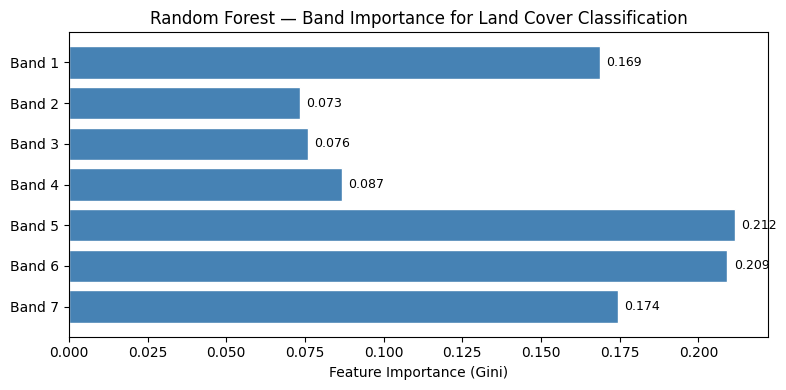

In [63]:
# ── Step 6: Feature importance ─────────────────────────────────────────────────
# Which Landsat band was most useful for classification?

importances = rf.feature_importances_
band_labels_list = [f"Band {i}" for i in range(1, 8)]

fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.barh(band_labels_list, importances, color="steelblue", edgecolor="white")
ax.set_xlabel("Feature Importance (Gini)")
ax.set_title("Random Forest — Band Importance for Land Cover Classification")
ax.invert_yaxis()
for bar, val in zip(bars, importances):
    ax.text(val + 0.002, bar.get_y() + bar.get_height()/2,
            f"{val:.3f}", va="center", fontsize=9)

plt.tight_layout()
plt.show()

---
## Spectral Profile Analysis

Before accepting the classification, we should check whether the four classes are **spectrally separable** — do they reflect light differently across the 7 bands?

We plot two views:
1. **Line plot** — mean reflectance per class across bands (the "spectral signature")
2. **Density plot** — distribution of all reflectance values per class across all bands

> If two classes overlap heavily, the classifier will struggle to tell them apart — the classic example here is **clouds vs developed land**, which both appear bright.

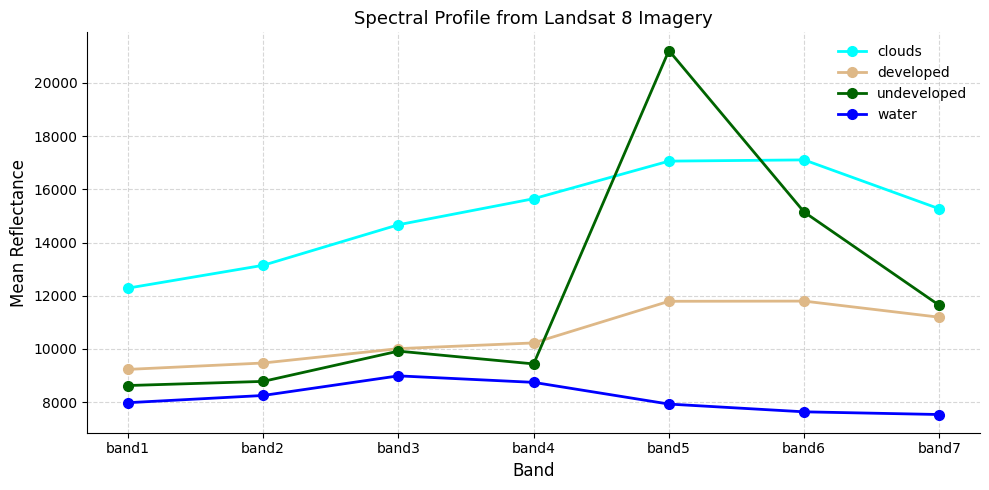

In [64]:
# ── Mean spectral profile per class ──────────────────────────────────────────
# Equivalent of R: group_by(id) %>% summarise(mean per band) then ggplot line

BAND_COLS = [f"band{i}" for i in range(1, 8)]

profiles = (
    df_extract
    .groupby("class")[BAND_COLS]
    .mean()
    .reset_index()
)

# Wide → long  (equivalent of tidyr::gather)
profiles_long = profiles.melt(
    id_vars="class",
    value_vars=BAND_COLS,
    var_name="band",
    value_name="reflectance"
)

fig, ax = plt.subplots(figsize=(10, 5))
for cls, colour in CLASS_COLOURS.items():
    subset = profiles_long[profiles_long["class"] == cls]
    ax.plot(subset["band"], subset["reflectance"],
            marker="o", linewidth=2, markersize=7,
            color=colour, label=cls)

ax.set_xlabel("Band", fontsize=12)
ax.set_ylabel("Mean Reflectance", fontsize=12)
ax.set_title("Spectral Profile from Landsat 8 Imagery", fontsize=13)
ax.legend(frameon=False)
ax.grid(True, linestyle="--", alpha=0.5)
sns.despine(ax=ax)
plt.tight_layout()
plt.show()

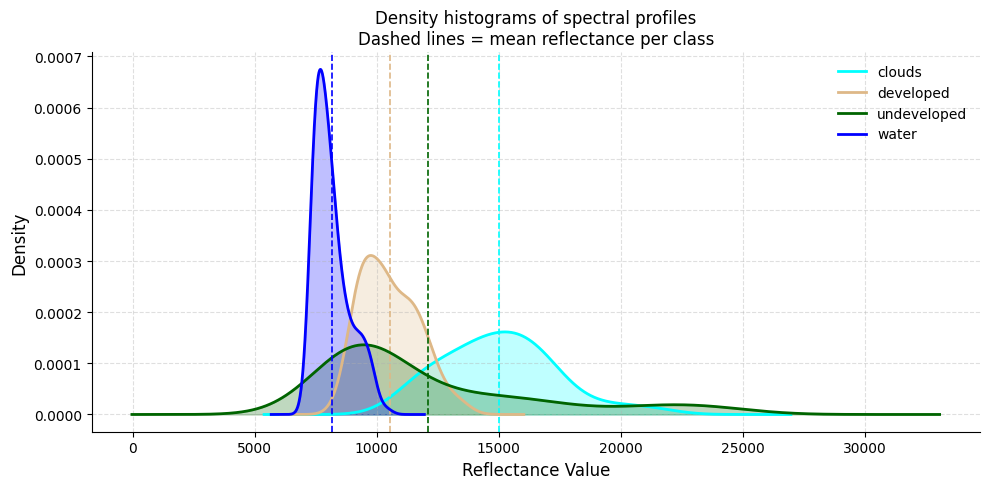

If there is overlap between categories, the model may struggle to differentiate them.


In [65]:
# ── Density histograms of spectral profiles ───────────────────────────────────
# Equivalent of R: geom_density() + geom_vline(grp.mean)
#
# If clouds and developed land overlap heavily, expect the classifier to confuse them.

all_values_long = df_extract.melt(
    id_vars=["class"],
    value_vars=BAND_COLS,
    var_name="band",
    value_name="reflectance"
)
class_means = all_values_long.groupby("class")["reflectance"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
for cls, colour in CLASS_COLOURS.items():
    vals = all_values_long[all_values_long["class"] == cls]["reflectance"]
    vals.plot.kde(ax=ax, color=colour, linewidth=2, label=cls)
    ax.fill_between(
        ax.lines[-1].get_xdata(),
        ax.lines[-1].get_ydata(),
        alpha=0.25, color=colour
    )
    ax.axvline(class_means[cls], color=colour, linestyle="--", linewidth=1.2)

ax.set_xlabel("Reflectance Value", fontsize=12)
ax.set_ylabel("Density", fontsize=12)
ax.set_title(
    "Density histograms of spectral profiles\n"
    "Dashed lines = mean reflectance per class",
    fontsize=12
)
ax.legend(frameon=False)
ax.grid(True, linestyle="--", alpha=0.4)
sns.despine(ax=ax)
plt.tight_layout()
plt.show()
print("If there is overlap between categories, the model may struggle to differentiate them.")

---
## Decision Tree Classification

As well as Random Forest, we can use a **Decision Tree** (`rpart` in R → `sklearn.tree.DecisionTreeClassifier` in Python).

A decision tree asks a series of if/else questions about band values — each split is a **node**, each outcome is a **leaf**. Unlike Random Forest you can actually *read* the rules it learned, making it a great teaching tool.

> **Task 4:** After running the classification, comment on the accuracy with your partners. Look at West London — is Heathrow Airport being misclassified as cloud?

Tree depth: 3 | Leaves: 4


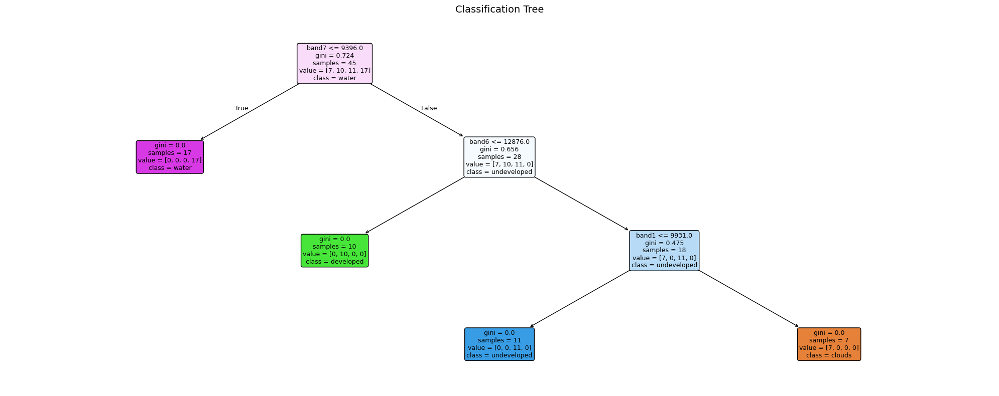

In [66]:
# ── Train decision tree ───────────────────────────────────────────────────────

X = df_extract[BAND_COLS].values
y = df_extract["class"].values

X_tr, X_te, y_tr, y_te = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

dt = DecisionTreeClassifier(max_depth=5, random_state=42)
dt.fit(X_tr, y_tr)
print(f"Tree depth: {dt.get_depth()} | Leaves: {dt.get_n_leaves()}")

# ── Visualise the tree ────────────────────────────────────────────────────────
# Equivalent of R: rpart.plot(model.class)
fig, ax = plt.subplots(figsize=(20, 8))
plot_tree(
    dt,
    feature_names=BAND_COLS,
    class_names=dt.classes_,
    filled=True, rounded=True,
    fontsize=9, ax=ax
)
ax.set_title("Classification Tree", fontsize=14)
plt.tight_layout()
plt.show()

---
## Model Evaluation — Confusion Matrix

A confusion matrix compares the **predicted** class to the **observed** (ground-truthed) class.

> **Task 5:** Try and interpret the matrix. Which classes are most often confused? See https://www.geeksforgeeks.org/machine-learning/confusion-matrix-machine-learning/

Key metrics to look for:
- **Accuracy** — % of all points classified correctly
- **Sensitivity (Recall)** — of points that *are* class X, how many did we catch?
- **Specificity** — of points that *aren't* class X, how many did we correctly exclude?

Note: a 100% accuracy on training points is common with few points — it does not mean the full map is perfect!

              precision    recall  f1-score   support

      clouds       0.67      1.00      0.80         2
   developed       1.00      0.50      0.67         2
 undeveloped       1.00      1.00      1.00         3
       water       1.00      1.00      1.00         5

    accuracy                           0.92        12
   macro avg       0.92      0.88      0.87        12
weighted avg       0.94      0.92      0.91        12



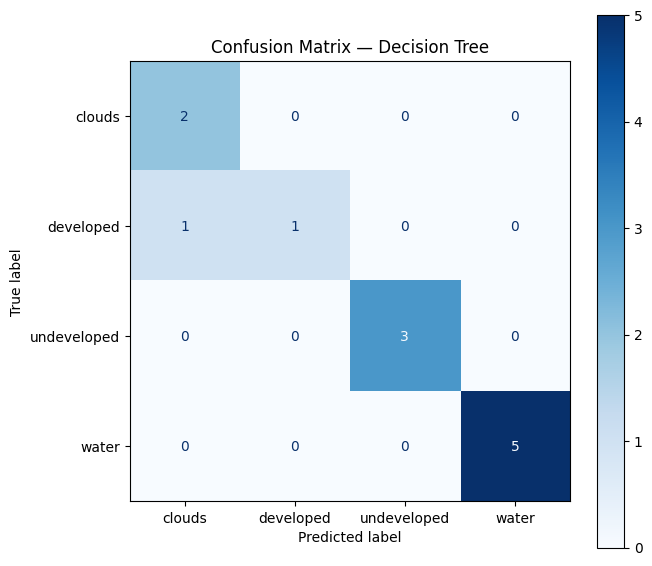


Note: You could create more training points using leafmap (see the section above).
More points don't automatically mean better accuracy — the quality and placement
of training points matters more than the quantity.



In [69]:
# ── Confusion matrix ─────────────────────────────────────────────────────────
# Equivalent of R: confusionMatrix(testProbs$obs, testProbs$pred)

y_pred_te = dt.predict(X_te)
print(classification_report(y_te, y_pred_te))

fig, ax = plt.subplots(figsize=(7, 6))
ConfusionMatrixDisplay.from_predictions(
    y_te, y_pred_te,
    display_labels=dt.classes_,
    cmap="Blues", ax=ax
)
ax.set_title("Confusion Matrix — Decision Tree", fontsize=12)
plt.tight_layout()
plt.show()

print("""
Note: You could create more training points using leafmap (see the section above).
More points don't automatically mean better accuracy — the quality and placement
of training points matters more than the quantity.
""")

---
## Final Classification Map

A richer three-panel view of the decision tree classification result for great visualisation.

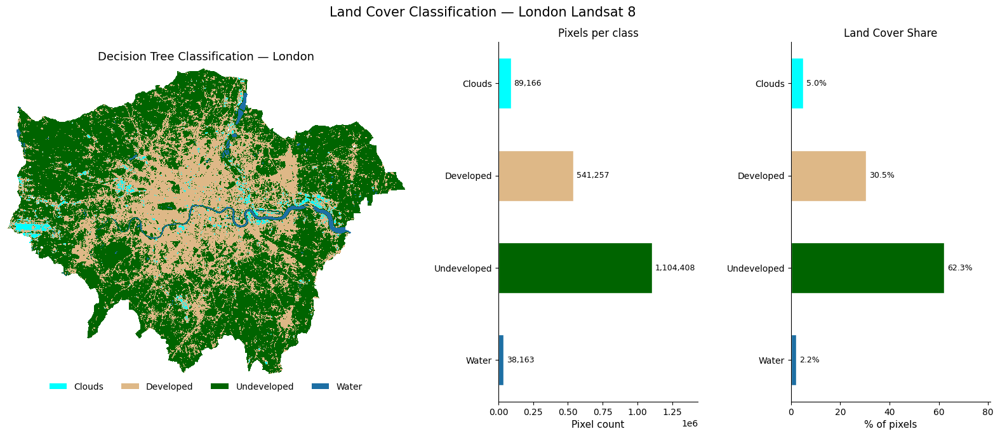

In [75]:
# ── Rich 3-panel classification visualisation ─────────────────────────────────
# Mirrors the NDVI 3-panel layout: map | pixel count bar | % share bar

CLASS_SCHEME = [
    {"label": "Clouds",      "id": 1, "colour": "cyan"},
    {"label": "Developed",   "id": 2, "colour": "burlywood"},
    {"label": "Undeveloped", "id": 3, "colour": "darkgreen"},
    {"label": "Water",       "id": 4, "colour": "#1d6fa4"},
]

total_valid  = int(np.sum(~np.isnan(predicted_map_dt)))
class_counts = [int(np.nansum(predicted_map_dt == c["id"])) for c in CLASS_SCHEME]
pcts         = [n / total_valid * 100 for n in class_counts]
colours      = [c["colour"] for c in CLASS_SCHEME]
labels       = [c["label"] for c in CLASS_SCHEME]

# ── Figure layout: map | count bar | % bar ───────────────────────────────────
fig = plt.figure(figsize=(20, 7))
gs  = fig.add_gridspec(1, 3, width_ratios=[2, 1, 1], wspace=0.35)
ax_map = fig.add_subplot(gs[0])
ax_cnt = fig.add_subplot(gs[1])
ax_pct = fig.add_subplot(gs[2])

# ── Panel 1: classification map with horizontal legend at bottom ──────────────
from matplotlib.patches import Patch
cmap_cls = mcolors.ListedColormap(colours)
norm_cls = mcolors.BoundaryNorm([0.5, 1.5, 2.5, 3.5, 4.5], cmap_cls.N)
ax_map.imshow(predicted_map_dt, cmap=cmap_cls, norm=norm_cls)
ax_map.set_title("Decision Tree Classification — London", fontsize=13, pad=10)
ax_map.set_axis_off()

# Horizontal patch legend placed below the map
legend_handles = [
    Patch(facecolor=c["colour"], label=c["label"]) for c in CLASS_SCHEME
]
ax_map.legend(
    handles=legend_handles,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.08),
    ncol=4,
    frameon=False,
    fontsize=10,
)

# ── Panel 2: pixel count horizontal bar ──────────────────────────────────────
bars = ax_cnt.barh(labels, class_counts, color=colours, edgecolor="white", height=0.55)
ax_cnt.set_xlabel("Pixel count", fontsize=11)
ax_cnt.set_title("Pixels per class", fontsize=12)
ax_cnt.set_xlim(0, max(class_counts) * 1.3)
for bar, n in zip(bars, class_counts):
    ax_cnt.text(n + max(class_counts) * 0.02,
                bar.get_y() + bar.get_height() / 2,
                f"{n:,}", va="center", fontsize=9)
ax_cnt.invert_yaxis()
sns.despine(ax=ax_cnt)

# ── Panel 3: % share horizontal bar ──────────────────────────────────────────
bars2 = ax_pct.barh(labels, pcts, color=colours, edgecolor="white", height=0.55)
ax_pct.set_xlabel("% of pixels", fontsize=11)
ax_pct.set_title("Land Cover Share", fontsize=12)
ax_pct.set_xlim(0, max(pcts) * 1.3)
for bar, pct in zip(bars2, pcts):
    ax_pct.text(pct + max(pcts) * 0.02,
                bar.get_y() + bar.get_height() / 2,
                f"{pct:.1f}%", va="center", fontsize=9)
ax_pct.invert_yaxis()
sns.despine(ax=ax_pct)

fig.suptitle("Land Cover Classification — London Landsat 8", fontsize=15, y=1.01)
plt.subplots_adjust(top=0.93, wspace=0.35, bottom=0.12)
plt.show()

---
## What's Next? Satellite Embeddings

Everything we have done so far — loading bands, calculating NDVI, training a classifier — treats each pixel as a set of raw reflectance numbers. The next frontier asks a different question: **can we teach a model to *understand* what a landscape looks like, the same way large language models understand text?**

### What are embeddings?

An **embedding** is a compact numeric vector (e.g. 512 numbers) that encodes the *meaning* of an image patch — not just its raw pixel values, but what it represents: a park, a motorway interchange, a reservoir, a housing estate. Two patches that look similar will have vectors that are close together in this high-dimensional space, even if they are on opposite sides of the world.

```
Raw Landsat patch (7 bands × 64×64 pixels = 28,672 numbers)
        ↓  foundation model  ↓
Embedding vector  (512 numbers)  ← searchable, comparable, clusterable
```

### Why does this matter?

Traditional classification (like what we did above) requires hand-labelled training points for every city and every time period. Embeddings change this. Note that the below points are very simplified (we would need a whole other session to tackle this properly).

- **Zero-shot search** — *"find all patches that look like this neighbourhood"* across a global archive, no labels needed
- **Change detection** — subtract embeddings over time to find where landscapes have changed
- **Cross-city transfer** — a model trained on London embeddings can classify Paris without retraining
- **Multimodal fusion** — combine satellite embeddings with census data, street view, or social media

### Where to explore further

🔗 **EMBED2Social Workshop 2026** — tutorials and materials on using embeddings for social science research:  
https://imago-sdruk.github.io/EMBED2Social-Workshop-2026/Materials.html

🔗 **Imago Data Catalogue** — a UK data service for satellite imagery, including pre-computed embedding datasets ready to use:  
https://data.imago.ac.uk/datasets?search=embeddings

The Imago data catalogue lets you download embeddings for small admin areas directly — no GPU, no model training needed. You can load them into Python as numpy arrays and immediately run clustering, similarity search, or regression against socioeconomic variables.

> This is the direction the field is moving — from hand-crafted features like NDVI to learned representations that capture the full complexity of what a place looks like from space.

---
## Summary & Further Exercises

You have successfully:
- Cropped and masked Landsat 8 imagery to London using `rasterio` + `geopandas`
- Explored raster properties (CRS, resolution, extent)
- Plotted true-colour and false-colour composites with `earthpy`
- Calculated NDVI using vectorised `numpy` arithmetic
- Trained and evaluated a Random Forest classifier with `scikit-learn`
- Started evaluating accuracy with a confusion matrix
- Produced a rich 3-panel classification map

### Do-it-Yourself

1. **Digitise your own points** using [leafmap](https://leafmap.org/) and compare accuracy
2. **More training points** — but remember: quality beats quantity
3. **Add indices** — NDWI `(Green-NIR)/(Green+NIR)` or NDBI `(SWIR-NIR)/(SWIR+NIR)` as extra features
4. **Export** the classified map as a GeoTIFF for use in QGIS

```python
# Hint for exporting:
with rasterio.open("data/landsat/London_classified.tif", "w",
                   driver="GTiff", dtype="int8",
                   width=predicted_map.shape[1],
                   height=predicted_map.shape[0],
                   count=1, crs=src.crs,
                   transform=src.transform) as dst:
    dst.write(predicted_map.astype("int8"), 1)
```